# Irregularity

In [25]:
from src.utils import load_data
from scipy.stats import skew, kurtosis
import warnings
warnings.filterwarnings(action='ignore')

import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText
import numpy as np
import scipy.stats as stats
import torch

noise = np.random.normal(0, 1, (50000, ))
density = stats.gaussian_kde(noise)

def plot_pdf(ax, omics_name, omics, num_bins, exp, labeled_only: bool=False):
    data, _, feature_names = load_data("pancancer", "CPDB_v34", omics, exp, seed=0)
    if omics == "SYS":
        num_feats = data.x.shape[1] - 3
    if omics == "scRaw_all+nonzero_mean":
        num_feats = 30 #data.x.shape[1] // 10
    else:
        num_feats = data.x.shape[1]
    if labeled_only:
        data.x = data.x[(data.train_mask | data.val_mask | data.test_mask)]
    
    X = data.x.numpy()
    X = X.T
    np.random.shuffle(X)
    X = X.T

    std = (skew(X).std().round(3), kurtosis(X).std().round(3))
    rnge = skew(X).max()-skew(X).min(), kurtosis(X).max()-kurtosis(X).min()
    irregular = (((np.abs(skew(X)) > 2).sum() / X.shape[1]).round(3), ((np.abs(kurtosis(X)) > 7).sum() / X.shape[1]).round(3))
    text = "\n".join((r"$\sigma_{skewness}$ = " + f"{std[0]:.2f}",
                     r"$\sigma_{kurtosis}$ = " + f"{std[1]:.2f}",
                     r"$r_{skewness}$ = " + f"{rnge[0]:.2f}",
                     r"$r_{kurtosis}$ = " + f"{rnge[1]:.2f}"))
    bbox = {"boxstyle": "round", "alpha": 0.5}
    
    data.x = (data.x - data.x.mean(0)) / data.x.std(0)
    for i in range(num_feats):
        y, bins = torch.histogram(data.x[:, i], bins=num_bins, range=(-2, 2), density=True)
        plt.plot(bins[:-1] + torch.diff(bins), y)#, label=feature_names[i][1] if isinstance(feature_names[i], tuple) else feature_names[i])

    ax.plot(bins[:-1] + torch.diff(bins), density(bins[:-1] + torch.diff(bins)), 
             label="normal", linestyle=":")
    ax.legend()
    ax.add_artist(AnchoredText(text, loc=2))
    ax.set_xlabel("z-score")
    ax.set_ylabel("Probability density")
    ax.set_ylim([-0.1, 3])
    ax.set_title(omics_name)

2983 796 2187
2983 796 2187
2983 796 2187
2983 796 2187
2983 796 2187
2983 796 2187


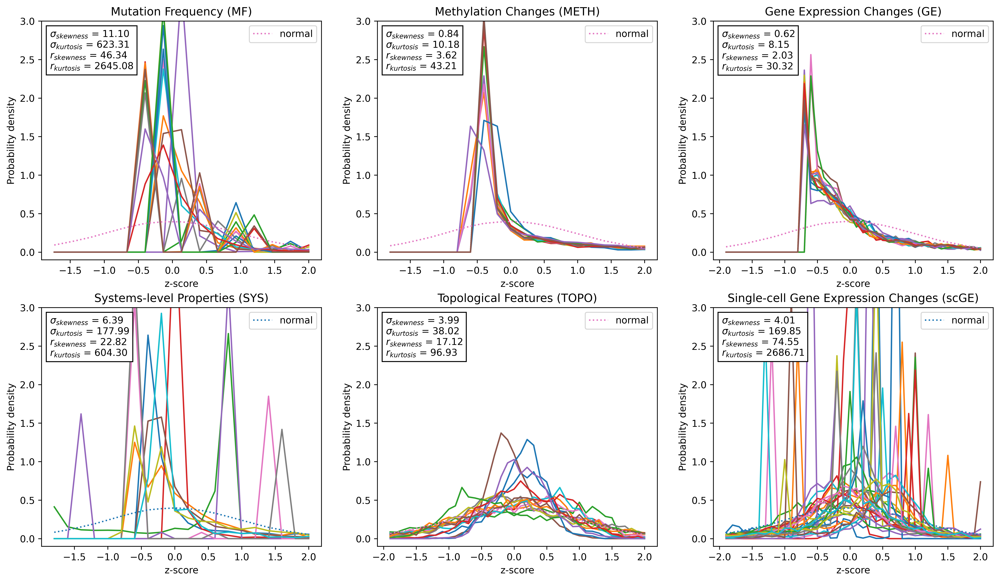

In [28]:
# Labeled set
f = plt.figure(figsize=(18, 10), dpi=600)
for i, (omics_name, omics, num_bins) in enumerate([("Mutation Frequency (MF)", "MF", 15), 
                                                   ("Methylation Changes (METH)", "METH", 20), 
                                                   ("Gene Expression Changes (GE)", "GE", 40), 
                                                   ("Systems-level Properties (SYS)", "SYS", 20),
                                                   ("Topological Features (TOPO)", "TOPO", 40),
                                                   ("Single-cell Gene Expression Changes (scGE)", "scRaw_all+nonzero_mean", 40)]):
    ax = f.add_subplot(230+i+1)
    plot_pdf(ax, omics_name, omics, num_bins, exp="xgb", labeled_only=True)
plt.show()

# Importance test

### Shapely (each genes)

In [2]:
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import pandas as pd
from glob import glob
import pickle as pkl
import shap
from tqdm import trange
from src.utils import load_data
import warnings
warnings.filterwarnings('ignore')

data, genes, feature_names = load_data("pancancer", "CPDB_v34", "MF+METH+GE+SYS+TOPO+scRaw_all+nonzero_mean", "xgb")


# expected_values, shap_values = [], []
# for i in trange(5):
#     for j in trange(10):
#         seed = j * 10000 + i
# #         seed = 0
#         with open(f"../crossvalid/xgb/pancancer/CPDB_v34/MF+METH+GE+SYS+TOPO+scRaw_all+nonzero_mean/models/model_{seed}.txt", "rb") as f:
#             model = pkl.load(f)
        
#         explainer = shap.TreeExplainer(model)
#         expected_values.append(explainer.expected_value)
#         shap_values.append(explainer.shap_values(data.x.numpy()))
        
# expected_values = np.stack(expected_values, axis=0)
# shap_values = np.stack(shap_values, axis=0)
# with open("expected_values.pkl", "wb") as f:
#     pkl.dump(expected_values, f)
# with open("shap_values.pkl", "wb") as f:
#     pkl.dump(shap_values, f)
with open("expected_values.pkl", "rb") as f:
    expected_values = pkl.load(f)
with open("shap_values.pkl", "rb") as f:
    shap_values = pkl.load(f)

expected_value = np.stack(expected_values, axis=0).mean(axis=0)
shap_value = np.stack(shap_values, axis=0).mean(axis=0)
shap_value_mask = shap_value[(data.train_mask|data.val_mask|data.test_mask)]

sys_f1=["essentiality_percentage", "expressed_tissues_rnaseq", "ppin_degree", "ppin_betweenness", 
                     "ppin_clustering", "complexes", "mirna", "ohnolog", "essentiality_oneCellLine", "ppin_hub"]
sys_f2=["Cell lines in which gene is essential (%)", "Number of Tissues expressing gene", "Degree of gene in PPI network",
 "Betweenness of gene in PPI network", "Clustering coefficient of gene in PPI network", "Number of complexes the protein is part of",
 "Number of miRNAs targeting the gene", "Gene is an ohnolog (binary)", "Gene is essential (binary)", "Protein is hub in PPI network (binary)"]
sys_change = {f1: f2 for f1, f2 in list(zip(sys_f1, sys_f2))}
multi_change = {"LUAD": "Lung adenocarcinoma",
 "LUSC": "Lung squamous cell carcinoma",
 "READ": "Rectum adenocarcinoma",
 "COAD": "Colon adenocarcinoma",
 "THCA": "Thyroid carcinoma",
 "BLCA": "Bladder carcinoma", 
 "UCEC": "Uterine corpus endometrial carcinoma",
 "ESCA": "Esophageal carcinoma",
 "STAD": "Stomach adenocarcinoma",
 "CESC": "Cervical squamous cell carcinoma and endocervical adenocarcinoma",
 "LIHC": "Liver hepatocellular carcinoma",
 "KIRC": "Kidney renal clear cell carcinoma",
 "KIRP": "Kidney renal papillary cell carcinoma",
 "HNSC": "Head and Neck squamous cell carcinoma",
 "BRCA": "Breast invasive carcinoma",
 "PRAD": "Prostate adenocarcinoma",
}
feature_names = [(f[0], sys_change[f[1]]) if f[0] == "SYS" else f for f in feature_names]
feature_names = [(f[0], multi_change[f[1]]) if f[0] in ["MF", "METH", "GE"] else f for f in feature_names]
feature_names = [("scGE", f[1].capitalize(), f[2][0].upper() + f[2][1:]) if f[0] == "nonzero_mean" else f for f in feature_names]
feature_names = [(f[0], "Dimension " + f[1].split()[1]) if f[0] == "TOPO" else f for f in feature_names]

gene2idx = {gene: i for i, gene in enumerate(genes)}
feat2idx = {feat: i for i, feat in enumerate(feature_names)}

In [12]:
shap_value_mask.shape

(2983, 655)

In [5]:
import numpy as np
import pandas as pd
from glob import glob

pred_files = glob("../crossvalid/xgb/pancancer/CPDB_v34/MF+METH+GE+SYS+TOPO+scRaw_all+nonzero_mean/preds/pred*")
preds = []
for f in pred_files:
    preds.append(np.loadtxt(f))
preds = np.stack(preds, axis=0).mean(0)
sort_idx = np.argsort(-preds)

In [6]:
sv, iv = [], []
curr = ""
merge_idx = []
feat_names_omics = []
for i, feat in enumerate(feature_names):
    if feat[0] != curr:
        if curr:
            sv.append(shap_value[:, merge_idx].sum(axis=1))
        feat_names_omics.append(feat[0])
        merge_idx = [i]
        curr = feat[0]
    else:
        merge_idx.append(i)
sv.append(shap_value[:, merge_idx].sum(axis=1))

shap_value_omics = np.stack(sv, axis=1)

sv = []
curr = ""
merge_idx = []
feat_names_omics = []
for i, feat in enumerate(feature_names):
    if feat[0] != curr:
        if curr:
            sv.append(shap_value_mask[:, merge_idx].sum(axis=1))
        feat_names_omics.append(feat[0])
        merge_idx = [i]
        curr = feat[0]
    else:
        merge_idx.append(i)
sv.append(shap_value_mask[:, merge_idx].sum(axis=1))

shap_value_mask_omics = np.stack(sv, axis=1)

In [7]:
sv_disease = {}
sv_disease_ct_all = {}
for i, feat in enumerate(feature_names):
    if feat[0] == "scGE":
        if sv_disease.get(feat[1]) is not None:
            sv_disease[feat[1]] += shap_value[:, i]
        else:
            sv_disease[feat[1]] = shap_value[:, i].copy()

        if sv_disease_ct_all.get(feat[1].capitalize() + "\n" + feat[2].split("_")[1]) is not None:
            sv_disease_ct_all[feat[1].capitalize() + "\n" + feat[2].split("_")[1]] += shap_value[:, i]
        else:
            sv_disease_ct_all[feat[1].capitalize() + "\n" + feat[2].split("_")[1]] = shap_value[:, i].copy()

    else:
        sv_disease[feat] = shap_value[:, i].copy()
        sv_disease_ct_all[feat] = shap_value[:, i].copy()

feat_names_disease, shap_value_disease = [], []
for k in sv_disease.keys():
    feat_names_disease.append(k)
    shap_value_disease.append(sv_disease[k])
shap_value_disease = np.stack(shap_value_disease, axis=1)

feat_names_disease_ct_all, shap_value_disease_ct_all = [], []
for k in sv_disease_ct_all.keys():
    feat_names_disease_ct_all.append(k)
    shap_value_disease_ct_all.append(sv_disease_ct_all[k])
shap_value_disease_ct_all = np.stack(shap_value_disease_ct_all, axis=1)



sv_mask_disease = {}
for i, feat in enumerate(feature_names):
    if feat[0] == "scGE":
        if sv_mask_disease.get(feat[1]) is not None:
            sv_mask_disease[feat[1]] += shap_value_mask[:, i]
        else:
            sv_mask_disease[feat[1]] = shap_value_mask[:, i].copy()

    else:
        sv_mask_disease[feat] = shap_value_mask[:, i].copy()

feat_names_disease, shap_value_mask_disease = [], []
for k in sv_mask_disease.keys():
    feat_names_disease.append(k)
    shap_value_mask_disease.append(sv_mask_disease[k])
shap_value_mask_disease = np.stack(shap_value_mask_disease, axis=1)

In [15]:
print(data.x[gene2idx["CCR7"], feat2idx[('nonzero_mean', 'colorectal cancer', 'blood_GZMK CD8 T cell')]])
print(data.x[gene2idx["CCR7"], feat2idx[('nonzero_mean', 'colorectal cancer', 'intestine_GZMK CD8 T cell')]])
print(data.x[gene2idx["CCR7"], feat2idx[('nonzero_mean', 'prostate cancer', 'prostate_Macrophage')]])

tensor(-0.3870)
tensor(-1.1975)
tensor(-2.3008)


In [24]:
top16_disease = np.array(feat_names_disease)[np.argsort(-np.abs(shap_value_disease[:, :-74]).mean(0))[:16]]
print(top16_disease)

sv_16 = {}
for i, feat in enumerate(feature_names):
    if feat[0] == "nonzero_mean" and feat[1] in top16_disease:
        if sv_16.get(feat[1]) is not None:
            sv_16[feat[1]] += shap_value_mask[:, i]
        else:
            sv_16[feat[1]] = shap_value_mask[:, i].copy()
print(sv_16)
shap_value_16 = []
for k in sv_16.keys():
    shap_value_16.append(sv_16[k])
shap_value_16 = np.stack(shap_value_16, axis=1)
print(shap_value_16.shape)
np.abs(shap_value_16.sum(1)).mean(0), shap_value_16.sum(1).mean(0)

['hepatocellular carcinoma' 'acute myeloid leukemia' 'multiple myeloma'
 'glioblastoma' 'head and neck squamous cell carcinoma'
 'high-grade serous ovarian cancer' 'clear cell renal cell carcinoma'
 'nasopharyngeal carcinoma' 'breast cancer'
 'pancreatic ductal adenocarcinoma' 'colorectal cancer'
 'intrahepatic cholangiocarcinoma' 'bladder carcinoma' 'prostate cancer'
 'melanoma' 'oral cancer']
{'acute myeloid leukemia': array([ 0.37891322, -0.1300168 , -0.502016  , ..., -0.3574888 ,
        0.06864437, -0.33117437], dtype=float32), 'multiple myeloma': array([ 0.38856027, -0.28612354, -0.12419905, ..., -0.03091956,
       -0.01442977, -0.1420239 ], dtype=float32), 'breast cancer': array([-0.00397164, -0.11369928, -0.02197873, ...,  0.0733164 ,
       -0.32529375, -0.08365314], dtype=float32), 'head and neck squamous cell carcinoma': array([ 0.09939448, -0.14573157,  0.03905567, ...,  0.01970389,
       -0.4143005 ,  0.03168594], dtype=float32), 'nasopharyngeal carcinoma': array([ 0.078

(1.3114228, -0.78416616)

In [9]:
top16_disease = np.array(feat_names_disease)[np.argsort(-np.abs(shap_value_mask_disease[:, :-74]).mean(0))[:16]]
print(top16_disease)

sv_16 = {}
for i, feat in enumerate(feature_names):
    if feat[0] == "scGE" and feat[1] in top16_disease:
        if sv_16.get(feat[1]) is not None:
            sv_16[feat[1]] += shap_value_mask[:, i]
        else:
            sv_16[feat[1]] = shap_value_mask[:, i].copy()
print(sv_16)
shap_value_16 = []
for k in sv_16.keys():
    shap_value_16.append(sv_16[k])
shap_value_16 = np.stack(shap_value_16, axis=1)
print(shap_value_16.shape)
np.abs(shap_value_16.sum(1)).mean(0), shap_value_16.sum(1).mean(0)

['Hepatocellular carcinoma' 'Acute myeloid leukemia' 'Multiple myeloma'
 'Glioblastoma' 'Head and neck squamous cell carcinoma'
 'Clear cell renal cell carcinoma' 'High-grade serous ovarian cancer'
 'Breast cancer' 'Nasopharyngeal carcinoma'
 'Pancreatic ductal adenocarcinoma' 'Colorectal cancer'
 'Intrahepatic cholangiocarcinoma' 'Bladder carcinoma' 'Melanoma'
 'Prostate cancer' 'Gastric cancer']
{'Acute myeloid leukemia': array([ 0.37891322, -0.1300168 , -0.502016  , ..., -0.3574888 ,
        0.06864437, -0.33117437], dtype=float32), 'Multiple myeloma': array([ 0.38856027, -0.28612354, -0.12419905, ..., -0.03091956,
       -0.01442977, -0.1420239 ], dtype=float32), 'Breast cancer': array([-0.00397164, -0.11369928, -0.02197873, ...,  0.0733164 ,
       -0.32529375, -0.08365314], dtype=float32), 'Head and neck squamous cell carcinoma': array([ 0.09939448, -0.14573157,  0.03905567, ...,  0.01970389,
       -0.4143005 ,  0.03168594], dtype=float32), 'Nasopharyngeal carcinoma': array([ 0.

(1.3107997, -0.7755843)

In [23]:
# np.argsort(-np.abs(shap_value_disease[:, :-74]).mean(0))
print(np.abs(shap_value_disease[:, :-74][np.argsort(-np.abs(shap_value_disease[:, :-74]).mean(0))[:16]].sum(1)).mean(0))
print(np.abs(shap_value_mask_disease[:, :-74][np.argsort(-np.abs(shap_value_mask_disease[:, :-74]).mean(0))[:16]].sum(1)).mean(0))

1.4414907
1.9501934


In [25]:
print(np.abs(shap_value_omics).mean(0), shap_value_omics.mean(0))
print(np.abs(shap_value_mask_omics).mean(0), shap_value_mask_omics.mean(0))

[1.423834   0.63506556 0.12334885 0.39596534 1.0597715  1.8994167 ] [-1.0622342  -0.06269849 -0.01093304 -0.08914895 -0.46045014 -0.933026  ]
[1.8542597 0.6763989 0.132731  0.5004695 1.2479994 2.100934 ] [-1.1314543  -0.10756718 -0.02468121 -0.23800597 -0.4808651  -0.78028876]


In [7]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

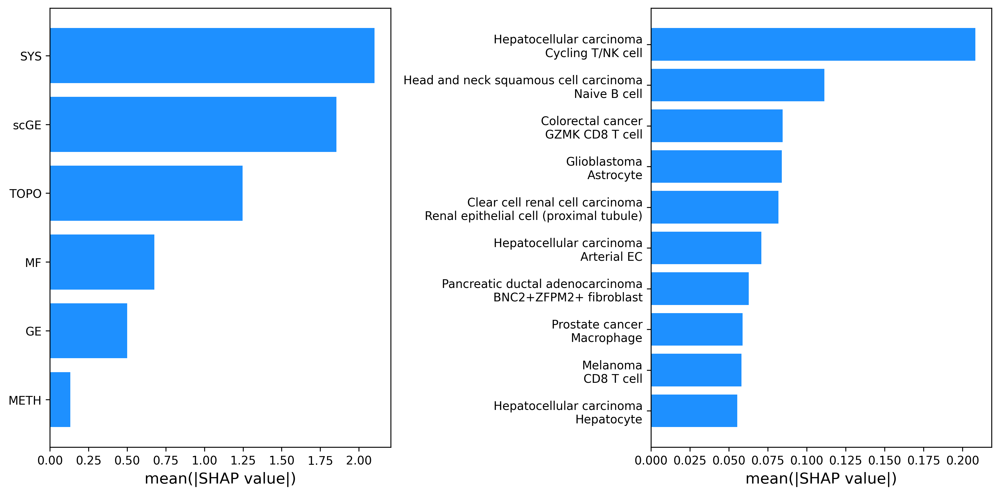

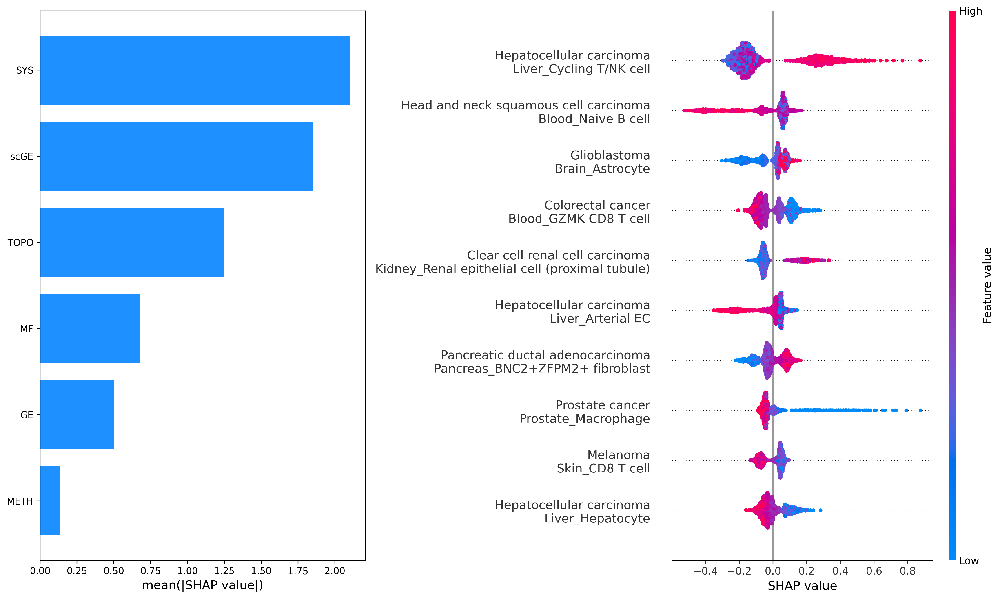

<Figure size 1920x1440 with 0 Axes>

In [11]:
import matplotlib.pyplot as plt


plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)

x = 6 - np.arange(len(feat_names_omics))
idx = np.argsort(-np.abs(shap_value_mask_omics).mean(0))
plt.barh(x, np.abs(shap_value_mask_omics).mean(0)[idx], color='dodgerblue')
plt.yticks(x, np.array([f if f != "nonzero_mean" else "scGE" for f in feat_names_omics])[idx])
plt.xlabel("mean(|SHAP value|)", fontsize=13)

plt.subplot(1, 2, 2)

shap.summary_plot(shap_values=shap_value_mask[:, [v for k, v in feat2idx.items() if "scGE" == k[0]]], 
                  features=data.x[(data.train_mask|data.val_mask|data.test_mask)][:, [v for k, v in feat2idx.items() if "scGE" == k[0]]].numpy(),
                  feature_names=['\n'.join((f[1], f[2])) for f in feature_names if f[0] == "scGE"],
                  plot_size=(15, 9),
                  max_display=10,
)

plt.tight_layout()
plt.show()

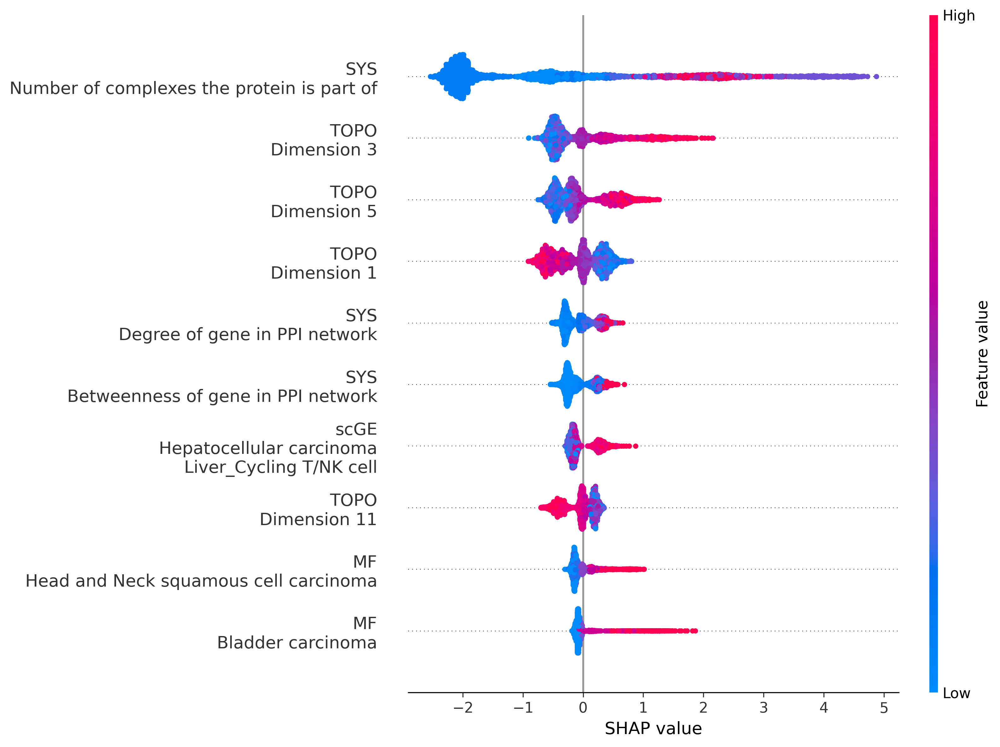

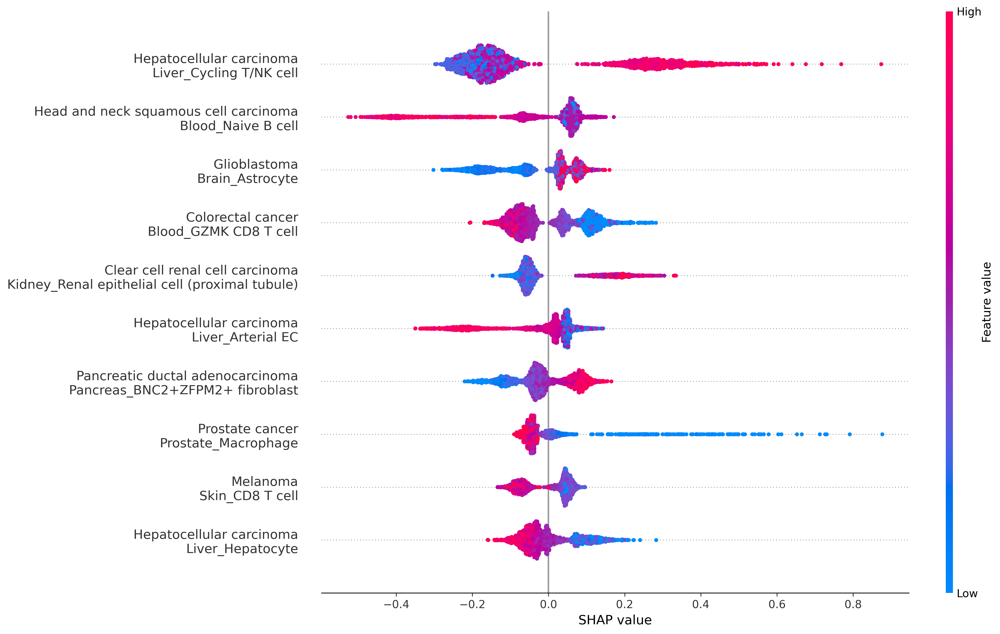

In [8]:

shap.summary_plot(shap_values=shap_value_mask, 
                  features=data.x[(data.train_mask|data.val_mask|data.test_mask)].numpy(),
                  feature_names=['\n'.join(f) for f in feature_names],
                  plot_size=(11, 8),
                  max_display=10,
)
shap.summary_plot(shap_values=shap_value_mask[:, [v for k, v in feat2idx.items() if "scGE" == k[0]]], 
                  features=data.x[(data.train_mask|data.val_mask|data.test_mask)][:, [v for k, v in feat2idx.items() if "scGE" == k[0]]].numpy(),
                  feature_names=['\n'.join((f[1], f[2])) for f in feature_names if f[0] == "scGE"],
                  plot_size=(15, 9),
                  max_display=10,
)

### Case study

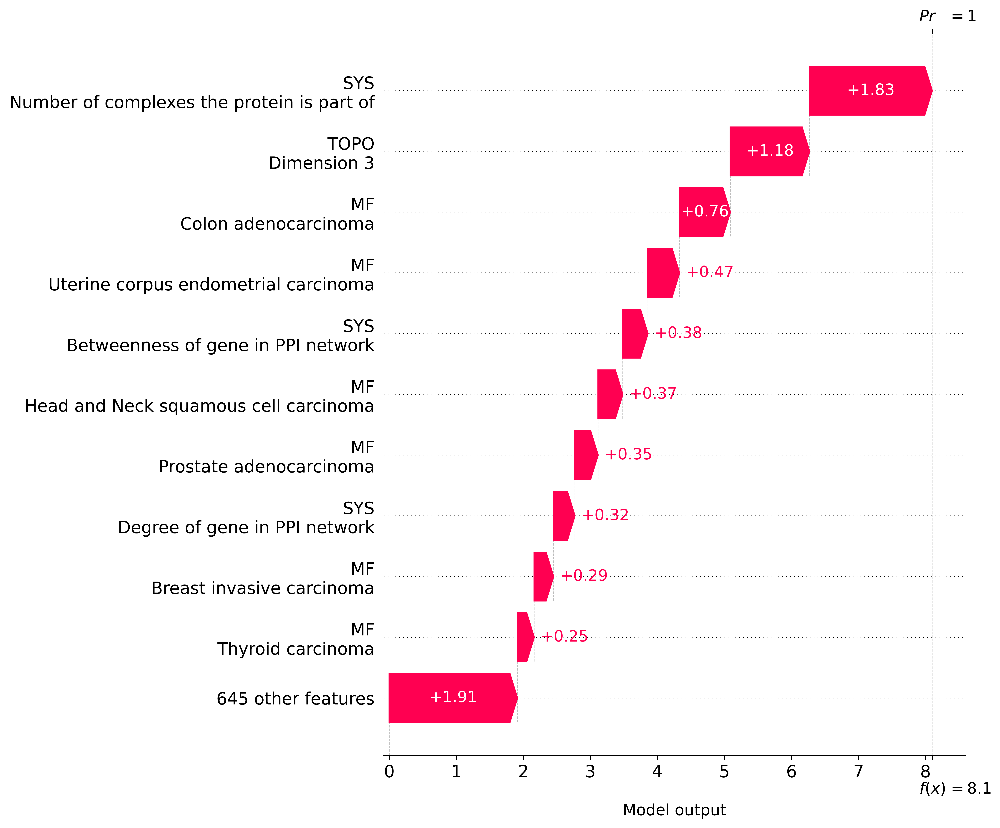

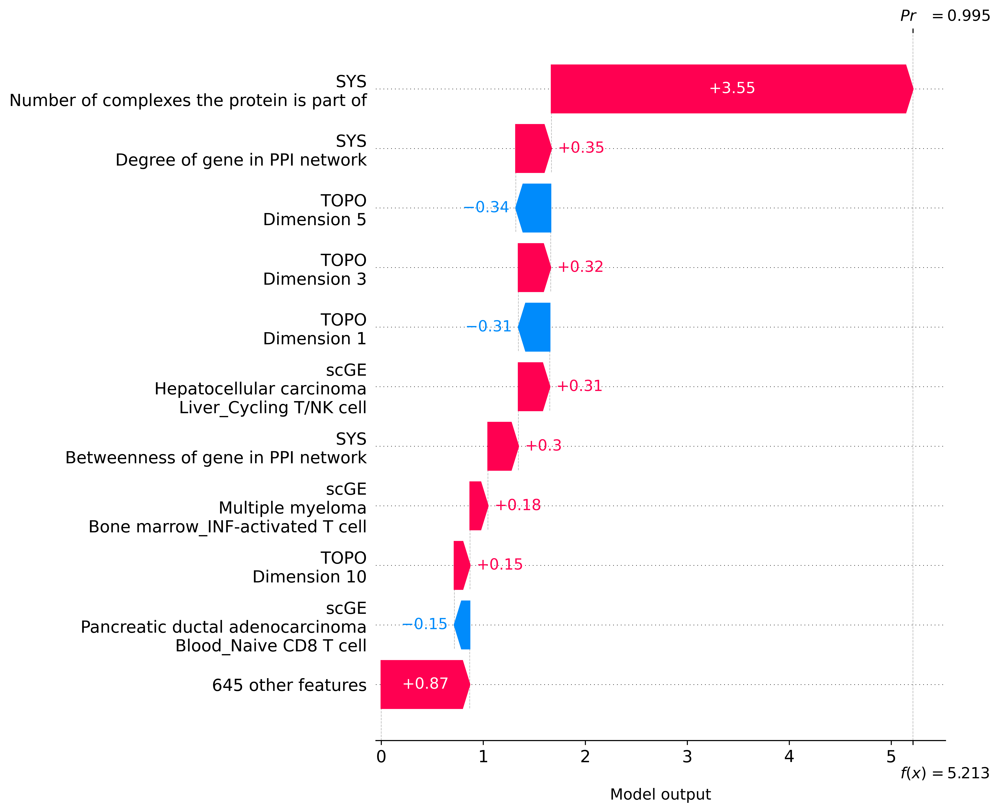

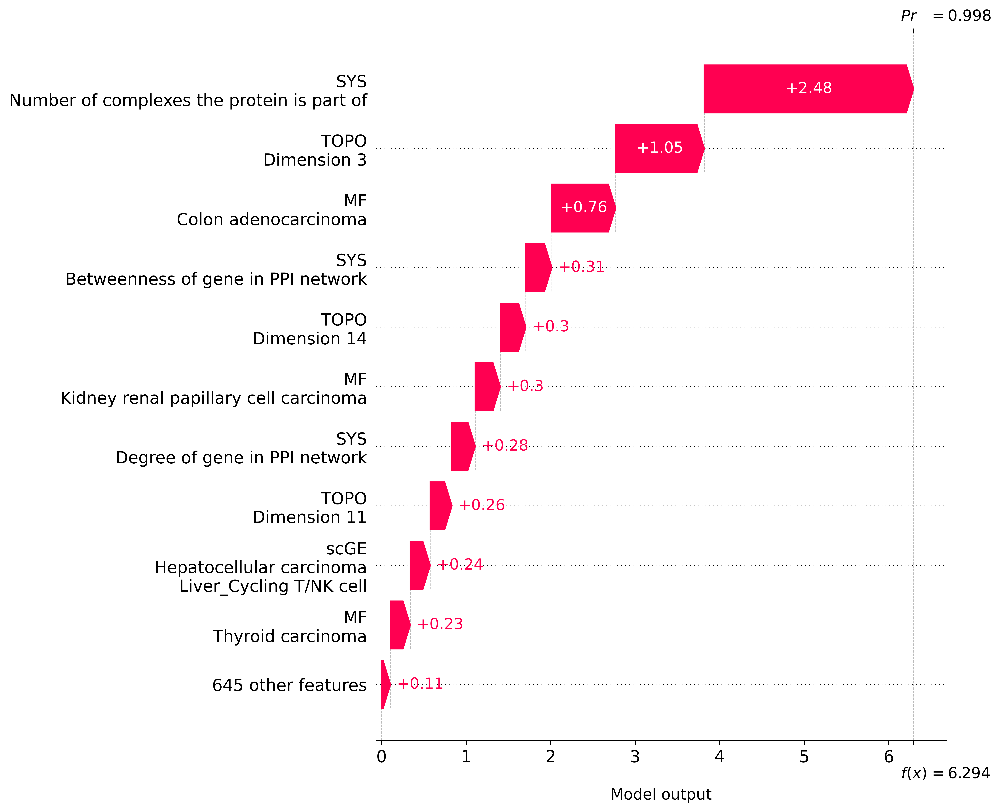

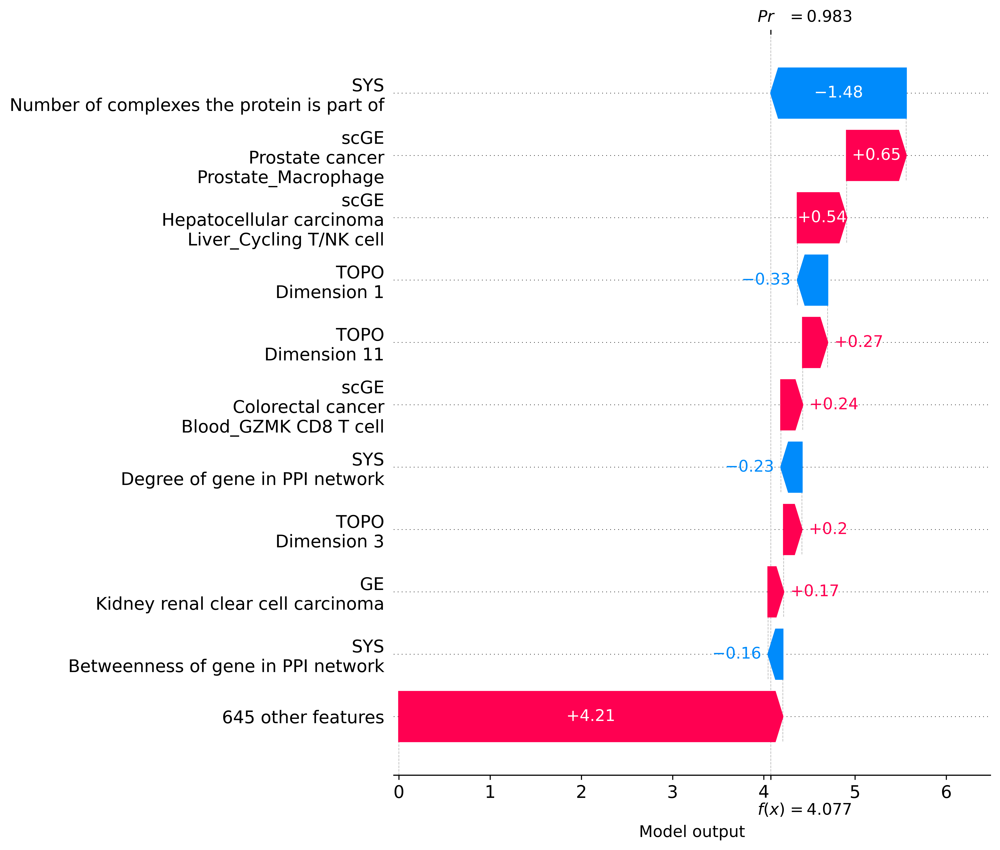

In [6]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600


fig = shap.plots._waterfall.waterfall_legacy(
    expected_value[0],
    shap_values=shap_value[gene2idx["APC"]],
    feature_names=['\n'.join(f) for f in feature_names],
    show=False,
    max_display=11,
)
fig.set_size_inches(8, 10)
plt.show()


fig = shap.plots._waterfall.waterfall_legacy(
    expected_value[0],
    shap_values=shap_value[gene2idx["STIL"]],
    feature_names=['\n'.join(f) for f in feature_names],
    show=False,
    max_display=11,
)
fig.set_size_inches(8, 10)
plt.show()


fig = shap.plots._waterfall.waterfall_legacy(
    expected_value[0],
    shap_values=shap_value[gene2idx["NRAS"]],
    feature_names=['\n'.join(f) for f in feature_names],
    show=False,
    max_display=11,
)
fig.set_size_inches(8, 10)
plt.show()


fig = shap.plots._waterfall.waterfall_legacy(
    expected_value[0],
    shap_values=shap_value[gene2idx["CCR7"]],
    feature_names=['\n'.join(f) for f in feature_names],
    show=False,
    max_display=11,
)
fig.set_size_inches(8, 10)
plt.show()


## Enrichr

In [3]:
import json
import requests


def get_enrich_df(genelist):
    ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/addList'
    genes_str = '\n'.join(genelist)
    description = 'Example gene list'
    payload = {
        'list': (None, genes_str),
        'description': (None, description)
    }

    response = requests.post(ENRICHR_URL, files=payload)
    if not response.ok:
        raise Exception('Error analyzing gene list')

    data = json.loads(response.text)
    
    ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/enrich'
    query_string = '?userListId=%s&backgroundType=%s'
    user_list_id = data['userListId']
    gene_set_library = 'KEGG_2021_Human'
    response = requests.get(
        ENRICHR_URL + query_string % (user_list_id, gene_set_library)
    )
    if not response.ok:
        raise Exception('Error fetching enrichment results')

    data = json.loads(response.text)
    df = pd.DataFrame(data['KEGG_2021_Human'],
                      columns=["Rank", "Term name", "P-value", "Odds ratio", "Combined score", "Overlapping genes", 
                               "Adjusted p-value", "Old p-value", "Old adjusted p-value"]
    )

    return df.iloc[:, :-2]

### Disease + Organ + Cell type

In [22]:
xgb_pred_files = sorted(glob("/db2/users/kyungwooklee/scDiRectX/crossvalid/xgb/pancancer/CPDB_v34/MF+METH+GE+SYS+TOPO+scRaw_all+nonzero_mean/preds/pred_*.txt"))[:50]

pred = []
for pf in xgb_pred_files:
    pred.append(np.loadtxt(pf, delimiter="\t"))

pred = np.stack(pred, axis=0).mean(0)

df = pd.DataFrame(shap_value, columns=feature_names, index=genes)
df["y"] = data.y.numpy()
df["label"] = (data.train_mask | data.val_mask | data.test_mask).numpy()
df["values"] = 1 / (1 + np.exp(-df.iloc[:, :-2].sum(1)))
df["pred"] = pred

df_rank = pd.concat([df.iloc[:, :-4].rank(axis=1, ascending=False), df.iloc[:, -4:]], axis=1)
df_abs_rank = pd.concat([df.iloc[:, :-4].abs().rank(axis=1, ascending=False), df.iloc[:, -4:]], axis=1)

### Cancer gene

In [23]:
print(df_rank[(df_rank[("scGE", "Hepatocellular carcinoma", "Liver_Cycling T/NK cell")] <= 10) & (df_rank["pred"] > 0.95)].index) #JOB4460_0332755480
df_1 = get_enrich_df(df_rank[(df_rank[("scGE", "Hepatocellular carcinoma", "Liver_Cycling T/NK cell")] <= 10) & (df_rank["pred"] > 0.95)].index)
df_1_10 = df_1.iloc[:10]
display(df_1_10)

print(df_rank[(df_rank[("scGE", "Prostate cancer", "Prostate_Macrophage")] <= 10) & (df_rank["pred"] > 0.95)].index)
df_4 = get_enrich_df(df_rank[(df_rank[("scGE", "Prostate cancer", "Prostate_Macrophage")] <= 10) & (df_rank["pred"] > 0.95)].index)
df_4_10 = df_4.iloc[:10]
display(df_4_10)

Index(['ABCG2', 'ACTN4', 'ADCY6', 'AHCTF1', 'AHNAK', 'AHR', 'AKT2', 'AMER1',
       'ANK3', 'AP1G1',
       ...
       'XIAP', 'XPO1', 'XRCC3', 'XRCC6', 'YWHAG', 'ZAP70', 'ZEB1', 'ZMYM3',
       'ZNF384', 'ZNF521'],
      dtype='object', length=453)


,Rank,Term name,P-value,Odds ratio,Combined score,Overlapping genes,Adjusted p-value
0,1,Pathways in cancer,3.305233e-36,8.006763,654.132956,"[RET, GSK3B, HSP90AB1, PIK3CD, KEAP1, CRKL, IK...",8.196978e-34
1,2,PI3K-Akt signaling pathway,4.447103e-21,6.866790,321.791766,"[GSK3B, HSP90AB1, PIK3CD, PRL, PIK3CG, HSP90B1...",5.514407e-19
2,3,Human T-cell leukemia virus 1 infection,7.963461e-21,9.135040,422.764360,"[CRTC1, XIAP, BUB1B, PIK3CD, ADCY6, RELB, IKBK...",6.583128e-19
3,4,Hepatitis B,4.251682e-20,10.887739,485.640937,"[PIK3CD, CASP9, IKBKB, MAPK8, NRAS, AKT2, MYC,...",2.636043e-18
4,5,Human papillomavirus infection,1.047822e-19,6.809588,297.595342,"[GSK3B, HDAC2, PXN, PIK3CD, UBE3A, IKBKB, SLC9...",5.197195e-18
5,6,Focal adhesion,3.277459e-18,8.715456,350.879593,"[GSK3B, PXN, XIAP, PIK3CD, ARHGAP5, CRKL, VTN,...",1.354683e-16
6,7,Epstein-Barr virus infection,3.294191e-17,8.323716,315.899892,"[HDAC2, PIK3CD, RELB, IKBKB, CASP9, MAPK8, CCN...",1.167085e-15
7,8,Cell cycle,5.145807e-17,11.474559,430.362093,"[GSK3B, HDAC2, CUL1, BUB1B, CCNB1, CCND2, MYC,...",1.595200e-15
8,9,Transcriptional misregulation in cancer,6.477891e-17,8.486560,316.341200,"[HDAC2, MAX, PRCC, MLLT1, MLLT3, LYL1, HOXA9, ...",1.785019e-15
9,10,T cell receptor signaling pathway,1.068261e-16,12.854378,472.724003,"[GSK3B, MAP2K1, CHUK, NFATC2, PIK3CD, MAPK14, ...",2.649287e-15


Index(['ACPP', 'ADCY6', 'AP1M2', 'APOE', 'AR', 'BAP1', 'BUB1', 'CANT1', 'CBLC',
       'CCNA1', 'CCR5', 'CCR7', 'CD274', 'CD82', 'CDC20', 'CDH1', 'CDX2',
       'CFH', 'CKB', 'CRLF2', 'CYP1B1', 'DGCR8', 'DNMT3B', 'EDEM1', 'EDN1',
       'ELF3', 'ELF4', 'ERG', 'ETS1', 'FBLN2', 'GATA4', 'GLI3', 'GRIA1',
       'GTF2F1', 'HOXA9', 'HOXB13', 'IGFBP3', 'IL17A', 'IL2RB', 'IL6', 'IRS1',
       'ITGA8', 'KLK3', 'LAMA1', 'LAMA3', 'LAMA5', 'LIFR', 'LRP2', 'MCM2',
       'MET', 'MME', 'MMP1', 'MMP9', 'MYH11', 'MYL9', 'NEFH', 'NFKB2',
       'NKX3-1', 'NOS3', 'NQO1', 'OLFM4', 'PARD3', 'PSCA', 'PTPRK', 'RARB',
       'RELA', 'RNF43', 'ROBO2', 'RXRA', 'S100A9', 'SDC1', 'SF3B3', 'SFN',
       'SH3GL2', 'SMO', 'SNAP25', 'SOX9', 'SS18', 'TBX3', 'TEAD1', 'TEAD2',
       'TFAP2C', 'TGFBR3', 'TMPRSS2', 'TUBB6', 'WIF1', 'WNK2', 'XRCC3', 'YAP1',
       'YES1', 'ZFPM2', 'ZNF384', 'ZNF462', 'ZNRF3'],
      dtype='object')


,Rank,Term name,P-value,Odds ratio,Combined score,Overlapping genes,Adjusted p-value
0,1,Pathways in cancer,3.035346e-16,12.369801,441.985824,"[NQO1, LAMA5, EDN1, MMP1, LAMA1, LAMA3, KLK3, ...",6.040338e-14
1,2,Transcriptional misregulation in cancer,1.042364e-10,16.037398,368.609341,"[SS18, CCNA1, IL6, HOXA9, RXRA, IGFBP3, IL2RB,...",1.037152e-08
2,3,Prostate cancer,3.677387e-07,17.715453,262.470266,"[AR, TMPRSS2, KLK3, ERG, MMP9, RELA, NKX3-1]",2.439333e-05
3,4,PI3K-Akt signaling pathway,8.512265e-07,7.558853,105.646978,"[LAMA5, IL6, RXRA, NOS3, IRS1, LAMA1, IL2RB, L...",4.234852e-05
4,5,Small cell lung cancer,4.724669e-06,15.713531,192.690518,"[LAMA5, RXRA, LAMA1, LAMA3, RARB, RELA]",1.775868e-04
5,6,IL-17 signaling pathway,5.354374e-06,15.354855,186.371042,"[IL6, MMP1, MMP9, S100A9, RELA, IL17A]",1.775868e-04
6,7,Human T-cell leukemia virus 1 infection,9.024410e-06,8.682905,100.856959,"[CDC20, CCNA1, IL6, IL2RB, ETS1, RELA, ADCY6, ...",2.565511e-04
7,8,Relaxin signaling pathway,3.278936e-05,10.966186,113.230330,"[EDN1, MMP1, NOS3, MMP9, RELA, ADCY6]",8.156354e-04
8,9,Fluid shear stress and atherosclerosis,4.985277e-05,10.136535,100.416935,"[NQO1, EDN1, NOS3, SDC1, MMP9, RELA]",1.102300e-03
9,10,ECM-receptor interaction,5.931393e-05,13.417490,130.587955,"[LAMA5, LAMA1, LAMA3, ITGA8, SDC1]",1.180347e-03


In [26]:
df_1[["Term name", "Adjusted p-value", "P-value"]].to_csv("../supplementary/file4_enrichr_HCC_TNK.csv", index=False)
df_4[["Term name", "Adjusted p-value", "P-value"]].to_csv("../supplementary/file4_enrichr_PCa_Macrophage.csv", index=False)

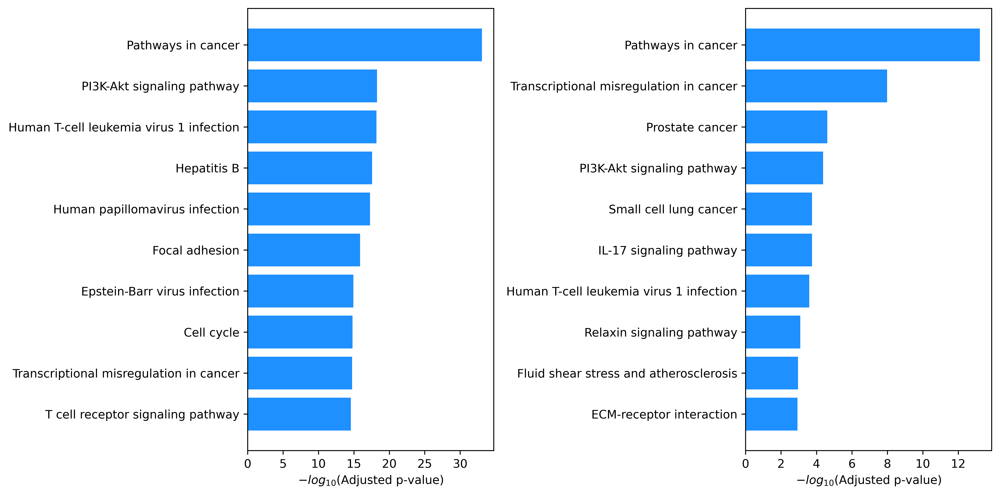

In [24]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
x = 10 - np.arange(10)
plt.barh(x, -np.log10(df_1_10["Adjusted p-value"]), color='dodgerblue')
plt.yticks(x, df_1_10["Term name"])
plt.xlabel("$-log_{10}$(Adjusted p-value)")

plt.subplot(1, 2, 2)
x = 10 - np.arange(10)
plt.barh(x, -np.log10(df_4_10["Adjusted p-value"]), color='dodgerblue')
plt.yticks(x, df_4_10["Term name"])
plt.xlabel("$-log_{10}$(Adjusted p-value)")

plt.tight_layout()
plt.show()